<a href="https://colab.research.google.com/github/Abhiraj36/Compression01/blob/main/Zig_Zag_Linear_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

MSE: 0.1155, PSNR: 9.37 dB, SSIM: 0.0450, IEF: 1.46


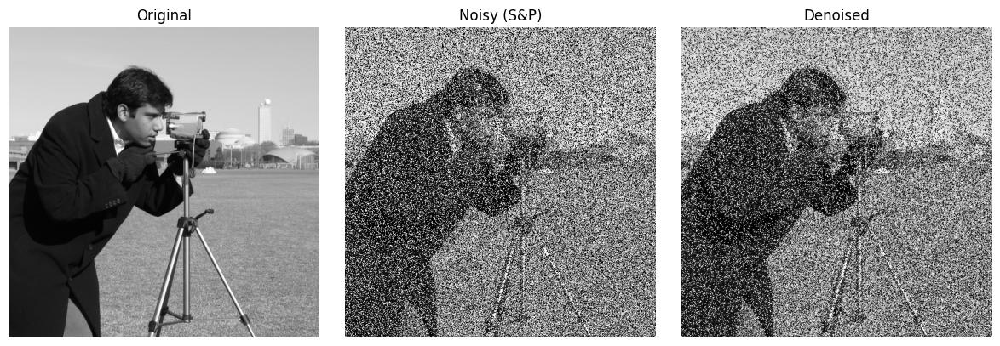

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))  # avoid div by zero

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))  # fuzzy S-norm then T-norm

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1  # Mark noisy
    return detected

def zigzag_order(matrix):
    rows, cols = matrix.shape
    result = []
    for i in range(rows):
        if i % 2 == 0:
            result.extend(matrix[i])
        else:
            result.extend(matrix[i][::-1])
    return np.array(result)

def linear_regression_denoise(fuzzy_masked_img, window_size=3, max_w=5):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:  # noisy
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = zigzag_order(region)

                    good_pixels = region_flat[region_flat != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1)
                        p = good_pixels

                        n_bar = np.mean(n)
                        p_bar = np.mean(p)

                        numerator = np.sum((n - n_bar) * (p - p_bar))
                        denominator = np.sum((n - n_bar) ** 2) + 1e-6  # avoid div by 0

                        beta_1 = numerator / denominator
                        beta_0 = p_bar - beta_1 * n_bar

                        pred = beta_0 + beta_1 * (len(good_pixels) // 2 + 1)
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5  # fallback
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    # Use sample Lena image from skimage
    lena = data.camera()
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = linear_regression_denoise(detected)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    # Show results
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


MSE: 0.1151, PSNR: 9.39 dB, SSIM: 0.0452, IEF: 1.46


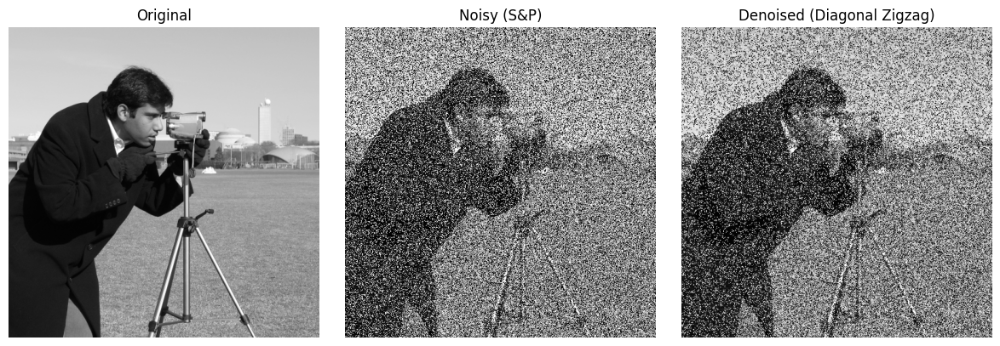

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))  # avoid div by zero

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))  # fuzzy S-norm then T-norm

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1  # Mark noisy
    return detected

#  NEW: Diagonal zig-zag order
def diagonal_zigzag_order(matrix):
    rows, cols = matrix.shape
    result = []

    for s in range(rows + cols - 1):
        if s % 2 == 0:
            for i in range(s, -1, -1):
                j = s - i
                if i < rows and j < cols:
                    result.append(matrix[i, j])
        else:
            for j in range(s, -1, -1):
                i = s - j
                if i < rows and j < cols:
                    result.append(matrix[i, j])
    return np.array(result)

def linear_regression_denoise(fuzzy_masked_img, window_size=3, max_w=5):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:  # noisy
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = diagonal_zigzag_order(region)

                    good_pixels = region_flat[region_flat != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1)
                        p = good_pixels

                        n_bar = np.mean(n)
                        p_bar = np.mean(p)

                        numerator = np.sum((n - n_bar) * (p - p_bar))
                        denominator = np.sum((n - n_bar) ** 2) + 1e-6  # avoid div by 0

                        beta_1 = numerator / denominator
                        beta_0 = p_bar - beta_1 * n_bar

                        pred = beta_0 + beta_1 * (len(good_pixels) // 2 + 1)
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5  # fallback
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    # Use sample Lena-like image from skimage
    lena = data.camera()
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = linear_regression_denoise(detected)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    # Show results
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Diagonal Zigzag)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


**Ridge Regression**

MSE: 0.1158, PSNR: 9.36 dB, SSIM: 0.0445, IEF: 1.46


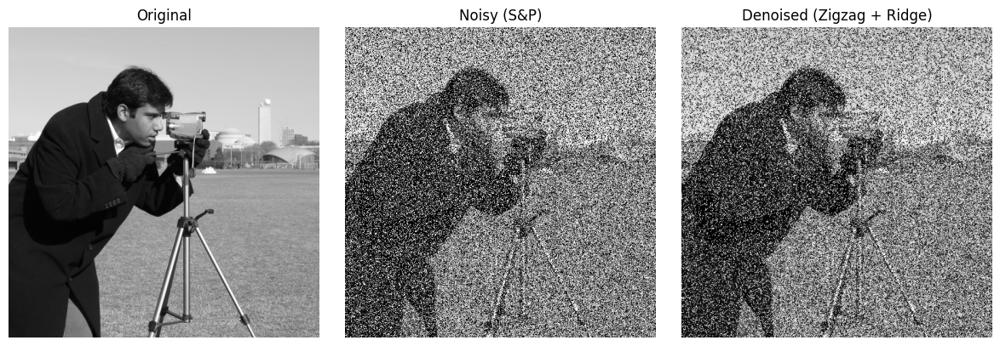

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))  # avoid div by zero

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))  # fuzzy S-norm then T-norm

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1  # Mark noisy
    return detected

def diagonal_zigzag_order(matrix):
    rows, cols = matrix.shape
    result = []

    for s in range(rows + cols - 1):
        if s % 2 == 0:
            for i in range(s, -1, -1):
                j = s - i
                if i < rows and j < cols:
                    result.append(matrix[i, j])
        else:
            for j in range(s, -1, -1):
                i = s - j
                if i < rows and j < cols:
                    result.append(matrix[i, j])
    return np.array(result)

def linear_ridge_denoise(fuzzy_masked_img, window_size=3, max_w=5, lambda_=0.01):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:  # noisy
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = diagonal_zigzag_order(region)

                    good_pixels = region_flat[region_flat != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1)
                        p = good_pixels

                        X = np.vstack([np.ones_like(n), n]).T
                        XtX = X.T @ X
                        ridge_term = lambda_ * np.eye(2)
                        beta = np.linalg.inv(XtX + ridge_term) @ X.T @ p
                        beta_0, beta_1 = beta

                        pred = beta_0 + beta_1 * (len(good_pixels) // 2 + 1)
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5  # fallback
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    lena = data.camera()
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = linear_ridge_denoise(detected, lambda_=0.01)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    # Show results
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Zigzag + Ridge)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


row-wise + ridge

MSE: 0.1157, PSNR: 9.37 dB, SSIM: 0.0438, IEF: 1.45


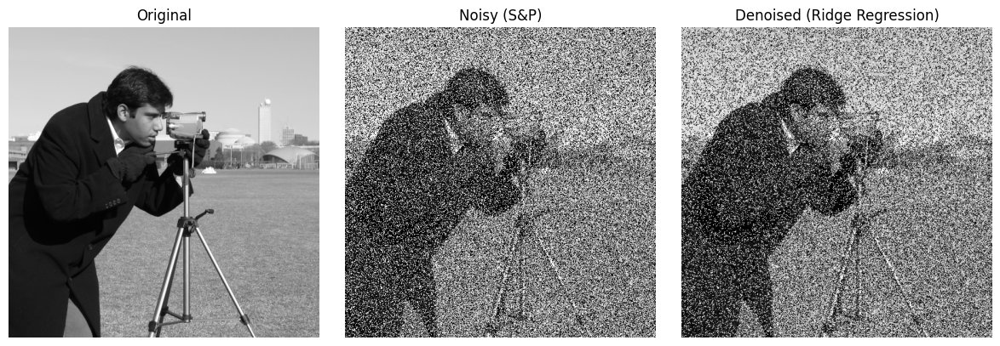

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))  # avoid div by zero

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))  # fuzzy S-norm then T-norm

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1  # Mark noisy
    return detected

def linear_ridge_denoise(fuzzy_masked_img, window_size=3, max_w=5, lambda_=0.01):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:  # noisy
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = region.flatten()  #  Row-wise (paper original)

                    good_pixels = region_flat[region_flat != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1)
                        p = good_pixels

                        # Ridge regression
                        X = np.vstack([np.ones_like(n), n]).T
                        XtX = X.T @ X
                        ridge_term = lambda_ * np.eye(2)
                        beta = np.linalg.inv(XtX + ridge_term) @ X.T @ p
                        beta_0, beta_1 = beta

                        pred = beta_0 + beta_1 * (len(good_pixels) // 2 + 1)
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5  # fallback
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    lena = data.camera()  # or replace with your own lena.png
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = linear_ridge_denoise(detected, lambda_=0.01)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    # Show results
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Ridge Regression)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
    # ---------- Create Table for Multiple Noise Densities ----------
    noise_levels = np.arange(0.3, 1.0, 0.1)
    results = []

    for noise_density in noise_levels:
        noisy_img = add_salt_pepper_noise(img, noise_density)
        detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
        denoised = linear_ridge_denoise(detected, lambda_=0.01)

        mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
        results.append([noise_density, mse, psnr, ssim, ief])

    # Print table
    print("\nNoise Density |    MSE    |   PSNR (dB)  |   SSIM   |   IEF")
    print("-"*60)
    for r in results:
        print(f"{r[0]:>6.1%}       {r[1]:.4f}     {r[2]:.2f}      {r[3]:.4f}     {r[4]:.2f}")



Noise Density |    MSE    |   PSNR (dB)  |   SSIM   |   IEF
------------------------------------------------------------
 30.0%       0.0583     12.34      0.1083     1.48
 40.0%       0.0793     11.01      0.0757     1.39
 50.0%       0.0952     10.22      0.0603     1.38
 60.0%       0.1073     9.69      0.0501     1.40
 70.0%       0.1162     9.35      0.0451     1.45
 80.0%       0.1191     9.24      0.0419     1.55
 90.0%       0.1198     9.21      0.0400     1.65


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e

MSE: 0.1158, PSNR: 9.36 dB, SSIM: 0.0443, IEF: 1.46


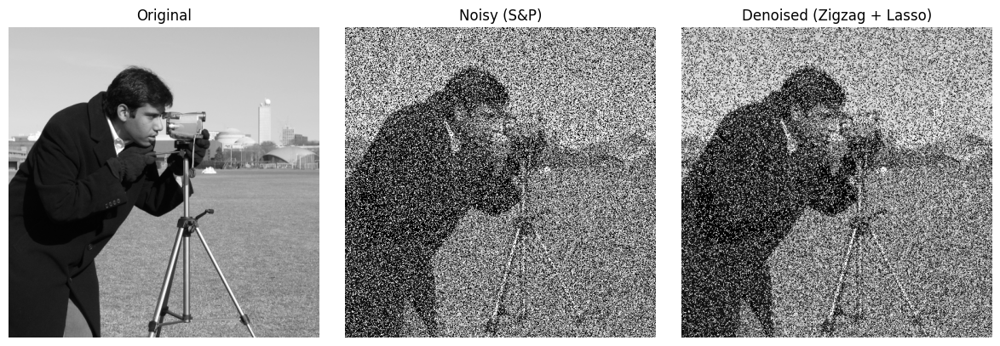

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from smatplotlib.pyplot as plt
from sklkimage import data
import earn.linear_model import Lasso

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1
    return detected

def diagonal_zigzag_order(matrix):
    rows, cols = matrix.shape
    result = []

    for s in range(rows + cols - 1):
        if s % 2 == 0:
            for i in range(s, -1, -1):
                j = s - i
                if i < rows and j < cols:
                    result.append(matrix[i, j])
        else:
            for j in range(s, -1, -1):
                i = s - j
                if i < rows and j < cols:
                    result.append(matrix[i, j])
    return np.array(result)

def lasso_denoise(fuzzy_masked_img, window_size=3, max_w=5, alpha=0.01):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = diagonal_zigzag_order(region)

                    good_pixels = region_flat[region_flat != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1).reshape(-1, 1)
                        p = good_pixels

                        model = Lasso(alpha=alpha, fit_intercept=True, max_iter=1000)
                        model.fit(n, p)

                        center_index = len(good_pixels) // 2 + 1
                        pred = model.predict([[center_index]])[0]
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    lena = data.camera()
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = lasso_denoise(detected, alpha=0.01)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Zigzag + Lasso)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e

MSE: 0.1146, PSNR: 9.41 dB, SSIM: 0.0452, IEF: 1.47


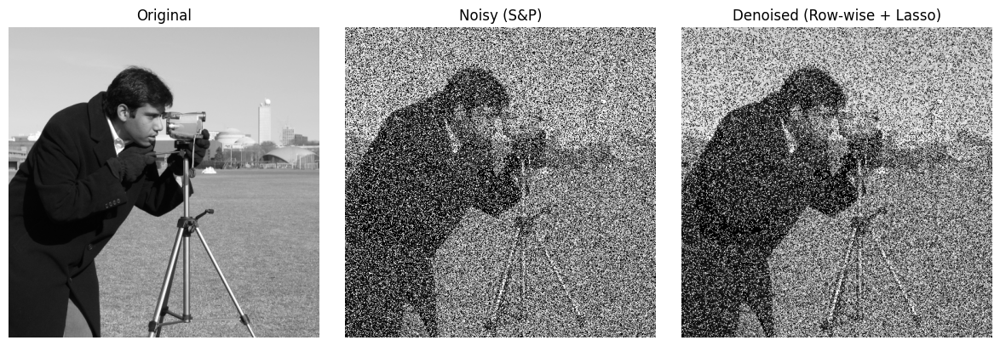

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt
from sklearn.linear_model import Lasso

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1
    return detected

def lasso_regression_denoise(fuzzy_masked_img, window_size=3, max_w=5, alpha=0.01):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = region.flatten()  #  row-wise

                    good_pixels = region_flat[region_flat != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1).reshape(-1, 1)
                        p = good_pixels

                        model = Lasso(alpha=alpha, fit_intercept=True, max_iter=1000)
                        model.fit(n, p)

                        center_index = len(good_pixels) // 2 + 1
                        pred = model.predict([[center_index]])[0]
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    lena = data.camera()
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = lasso_regression_denoise(detected, alpha=0.01)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    # Show results
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Row-wise + Lasso)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


zig-zig + vector

MSE: 0.1159, PSNR: 9.36 dB, SSIM: 0.0437, IEF: 1.45


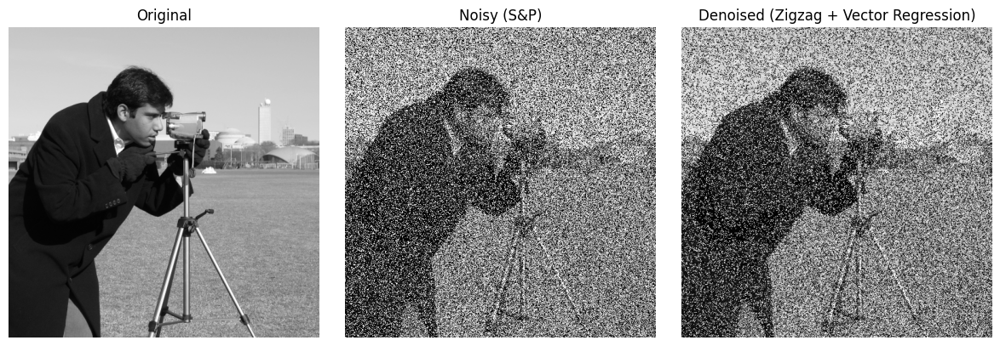

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0
    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1
    return detected

def diagonal_zigzag_order(matrix):
    rows, cols = matrix.shape
    result = []

    for s in range(rows + cols - 1):
        if s % 2 == 0:
            for i in range(s, -1, -1):
                j = s - i
                if i < rows and j < cols:
                    result.append(matrix[i, j])
        else:
            for j in range(s, -1, -1):
                i = s - j
                if i < rows and j < cols:
                    result.append(matrix[i, j])
    return np.array(result)

def zigzag_vector_regression_denoise(fuzzy_masked_img, max_w=5):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = diagonal_zigzag_order(region)

                    center_idx = len(region_flat) // 2
                    feature_vec = np.delete(region_flat, center_idx)
                    label_vec = feature_vec[feature_vec != -1]

                    if len(label_vec) >= 2:
                        X = np.arange(len(label_vec)).reshape(-1, 1)
                        y = label_vec

                        model = LinearRegression()
                        model.fit(X, y)

                        pred = model.predict([[len(label_vec)//2]])[0]
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    lena = data.camera()
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = zigzag_vector_regression_denoise(detected)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Zigzag + Vector Regression)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


MSE: 0.1152, PSNR: 9.38 dB, SSIM: 0.0459, IEF: 1.46


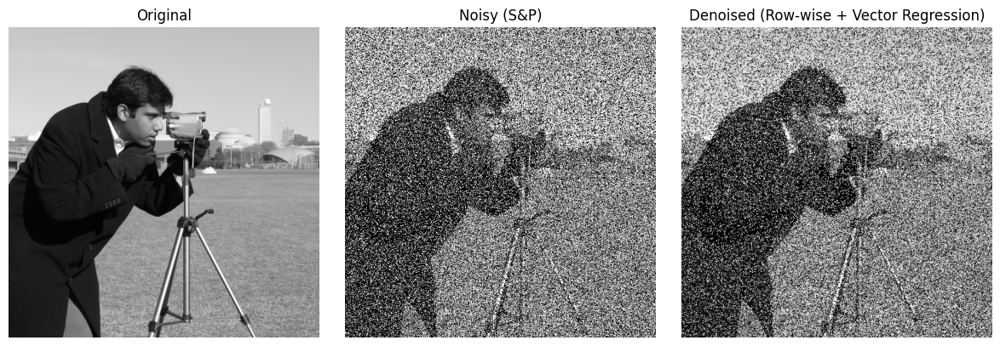

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0
    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:
                window_size = 2 * H + 1
                pad_img = np.pad(image, H, mode='reflect')
                W = pad_img[i:i + window_size, j:j + window_size].flatten()

                W_clean = W[(W != 0) & (W != 1)]
                if len(W_clean) == 0:
                    continue

                W_trimmed = np.array([x if x not in [0, 1] else np.mean(W_clean) for x in W])

                h = (len(W) + 1) // 2
                mu_list, sigma_list = [], []
                for k in range(1, h + 1):
                    m_k = k_middle_mean(W_trimmed, k)
                    var_k = k_middle_mean((W_trimmed - m_k) ** 2, k)
                    mu_list.append(m_k)
                    sigma_list.append(np.sqrt(var_k + 1e-6))

                memberships = np.array([
                    [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in W_trimmed]
                    for k in range(h)
                ])

                mean_membership = np.mean(memberships, axis=0)
                tau_m = np.min(np.max(memberships, axis=1))

                center_index = len(W) // 2
                if mean_membership[center_index] <= tau_m:
                    detected[i, j] = -1
    return detected

def vector_regression_rowwise_denoise(fuzzy_masked_img, max_w=5):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws]
                    region_flat = region.flatten()  # ✅ row-wise

                    center_idx = len(region_flat) // 2
                    features = np.delete(region_flat, center_idx)
                    features = features[features != -1]

                    if len(features) >= 2:
                        X = np.arange(len(features)).reshape(-1, 1)
                        y = features

                        model = LinearRegression()
                        model.fit(X, y)

                        pred = model.predict([[len(features) // 2]])[0]
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5
    return img

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    lena = data.camera()
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = vector_regression_rowwise_denoise(detected)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Row-wise + Vector Regression)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


MSE: 0.1538, PSNR: 8.13 dB, SSIM: 0.0357, IEF: 1.10


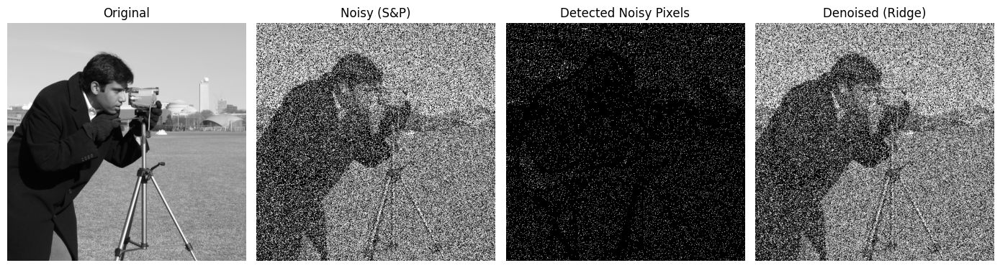

In [ ]:
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

# ---------- Improved Fuzzy Detection ----------

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)

    pad_img = np.pad(image, max_H, mode='reflect')  # Pre-pad for max window size

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:  # only check potential noisy pixels
                window_H = H

                while window_H <= max_H:
                    window_size = 2 * window_H + 1
                    region = pad_img[i:i + window_size, j:j + window_size].flatten()

                    # Trim 0 and 1
                    W_clean = region[(region != 0) & (region != 1)]
                    if len(W_clean) == 0:
                        region_trimmed = np.full_like(region, 0.5)
                    else:
                        mean_clean = np.mean(W_clean)
                        region_trimmed = np.array([x if x not in [0, 1] else mean_clean for x in region])

                    # Check if we have enough uncorrupted pixels
                    if len(W_clean) >= G or window_H == max_H:
                        h = (len(region_trimmed) + 1) // 2
                        mu_list, sigma_list = [], []
                        for k in range(1, h + 1):
                            m_k = k_middle_mean(region_trimmed, k)
                            var_k = k_middle_mean((region_trimmed - m_k) ** 2, k)
                            mu_list.append(m_k)
                            sigma_list.append(np.sqrt(var_k + 1e-6))

                        # Membership matrix (h x N)
                        memberships = np.array([
                            [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in region_trimmed]
                            for k in range(h)
                        ])

                        # τm: column-wise S-norm (max), then T-norm (min)
                        tau_m = np.min(np.max(memberships, axis=0))

                        # Compare center pixel membership with τm
                        center_idx = len(region_trimmed) // 2
                        center_membership = np.mean(memberships[:, center_idx])
                        if center_membership <= tau_m:
                            detected[i, j] = -1  # noisy pixel
                        break  # move to next pixel

                    window_H += 1

    return detected

# ---------- Ridge Regression Denoising ----------

def linear_ridge_denoise(fuzzy_masked_img, max_w=5, lambda_=0.01):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:  # noisy
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws].flatten()

                    good_pixels = region[region != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1)
                        p = good_pixels

                        # Ridge regression
                        X = np.vstack([np.ones_like(n), n]).T
                        XtX = X.T @ X
                        beta = np.linalg.inv(XtX + lambda_ * np.eye(2)) @ X.T @ p
                        pred = beta[0] + beta[1] * (len(good_pixels) // 2 + 1)
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5  # fallback

    return img

# ---------- Evaluation ----------

def evaluate_metrics(original, noisy, denoised):
    original = original.astype(np.float32)
    denoised = denoised.astype(np.float32)
    noisy = noisy.astype(np.float32)

    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN PIPELINE ----------

if __name__ == "__main__":
    lena = data.camera()  # or replace with your own lena.png
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = linear_ridge_denoise(detected, lambda_=0.01)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    # Show results (with noisy mask)
    mask = (detected == -1).astype(np.float32)

    plt.figure(figsize=(14, 4))
    plt.subplot(1, 4, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy (S&P)")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(mask, cmap='gray')
    plt.title("Detected Noisy Pixels")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Ridge)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


MSE: 0.1534, PSNR: 8.14 dB, SSIM: 0.0361, IEF: 1.10


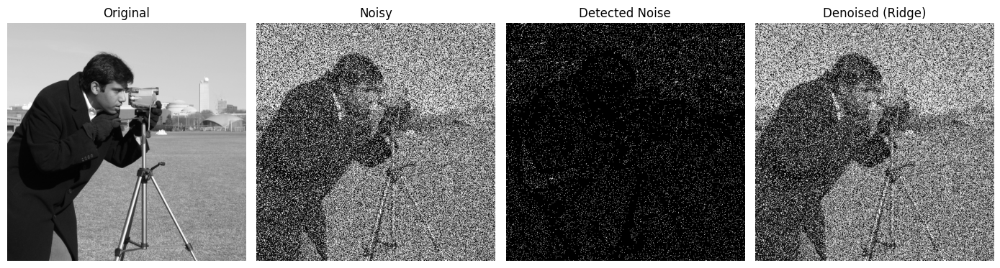

In [ ]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage import data
import matplotlib.pyplot as plt

# ---------- Utility Functions ----------

def normalize(img):
    return img.astype(np.float32) / 255.0

def add_salt_pepper_noise(image, noise_density):
    output = np.copy(image)
    num_pixels = image.size
    num_salt = int(noise_density * num_pixels / 2)
    num_pepper = int(noise_density * num_pixels / 2)

    coords_salt = tuple(np.random.randint(0, i, num_salt) for i in image.shape)
    coords_pepper = tuple(np.random.randint(0, i, num_pepper) for i in image.shape)

    output[coords_salt] = 1.0
    output[coords_pepper] = 0.0

    return output

def gaussian_membership(x, mean, sigma):
    return np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def k_middle_mean(arr, k):
    arr_sorted = np.sort(arr.flatten())
    h = len(arr_sorted) // 2
    start = max(h - k + 1, 0)
    end = min(h + k, len(arr_sorted))
    return np.mean(arr_sorted[start:end])

# ---------- Fuzzy Detection ----------

def fuzzy_detect(image, H=1, G=6, max_H=3):
    M, N = image.shape
    detected = np.copy(image)
    pad_img = np.pad(image, max_H, mode='reflect')

    for i in range(M):
        for j in range(N):
            if image[i, j] in [0, 1]:  # Only check potential noisy pixels
                window_H = H

                while window_H <= max_H:
                    window_size = 2 * window_H + 1
                    region = pad_img[i:i + window_size, j:j + window_size].flatten()

                    # Remove extreme values
                    W_clean = region[(region != 0) & (region != 1)]
                    if len(W_clean) == 0:
                        region_trimmed = np.full_like(region, 0.5)
                    else:
                        mean_clean = np.mean(W_clean)
                        region_trimmed = np.array([x if x not in [0, 1] else mean_clean for x in region])

                    # If we have enough good pixels or reached max window size
                    if len(W_clean) >= G or window_H == max_H:
                        h = (len(region_trimmed) + 1) // 2
                        mu_list, sigma_list = [], []
                        for k in range(1, h + 1):
                            m_k = k_middle_mean(region_trimmed, k)
                            var_k = k_middle_mean((region_trimmed - m_k) ** 2, k)
                            mu_list.append(m_k)
                            sigma_list.append(np.sqrt(var_k + 1e-6))

                        memberships = np.array([
                            [gaussian_membership(x, mu_list[k], sigma_list[k]) for x in region_trimmed]
                            for k in range(h)
                        ])

                        tau_m = np.min(np.max(memberships, axis=0))  # Paper: T-norm (min) after S-norm (max)
                        center_idx = len(region_trimmed) // 2
                        center_membership = np.mean(memberships[:, center_idx])

                        if center_membership <= tau_m:
                            detected[i, j] = -1  # Mark noisy pixel
                        break

                    window_H += 1

    return detected

# ---------- Ridge Regression Denoising ----------

def linear_ridge_denoise(fuzzy_masked_img, max_w=5, lambda_=0.01):
    img = np.copy(fuzzy_masked_img)
    H, W = img.shape

    for i in range(H):
        for j in range(W):
            if img[i, j] == -1:  # Only denoise noisy pixels
                for w in range(1, max_w + 1):
                    ws = 2 * w + 1
                    pad = w
                    padded = np.pad(img, pad, mode='reflect')
                    region = padded[i:i + ws, j:j + ws].flatten()

                    good_pixels = region[region != -1]
                    if len(good_pixels) > 1:
                        n = np.arange(1, len(good_pixels) + 1)
                        p = good_pixels

                        X = np.vstack([np.ones_like(n), n]).T
                        XtX = X.T @ X
                        beta = np.linalg.inv(XtX + lambda_ * np.eye(2)) @ X.T @ p

                        # Predict center pixel
                        pred = beta[0] + beta[1] * (len(good_pixels) // 2 + 1)
                        img[i, j] = np.clip(pred, 0, 1)
                        break
                else:
                    img[i, j] = 0.5  # Fallback if all neighbors are noisy
    return img

# ---------- Evaluation ----------

def evaluate_metrics(original, noisy, denoised):
    mse = np.mean((denoised - original) ** 2)
    psnr = peak_signal_noise_ratio(original, denoised, data_range=1.0)
    ssim = structural_similarity(original, denoised, data_range=1.0)
    ief = np.sum((noisy - original) ** 2) / np.sum((denoised - original) ** 2)
    return mse, psnr, ssim, ief

# ---------- MAIN ----------

if __name__ == "__main__":
    lena = data.camera()  # Replace with Lena.png if needed
    img = normalize(lena)

    noisy_img = add_salt_pepper_noise(img, noise_density=0.7)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = linear_ridge_denoise(detected, lambda_=0.01)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    print(f"MSE: {mse:.4f}, PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}, IEF: {ief:.2f}")

    # Visualization
    mask = (detected == -1).astype(np.float32)

    plt.figure(figsize=(14, 4))
    plt.subplot(1, 4, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title("Noisy")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(mask, cmap='gray')
    plt.title("Detected Noise")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(denoised, cmap='gray')
    plt.title("Denoised (Ridge)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
noise_levels = np.arange(0.3, 1.0, 0.1)
results = []

for noise_density in noise_levels:
    noisy_img = add_salt_pepper_noise(img, noise_density)
    detected = fuzzy_detect(noisy_img, H=1, G=6, max_H=3)
    denoised = linear_ridge_denoise(detected, lambda_=0.01)

    mse, psnr, ssim, ief = evaluate_metrics(img, noisy_img, denoised)
    results.append([noise_density, mse, psnr, ssim, ief])

# Print table
print("\nNoise Density |    MSE    |   PSNR (dB)  |   SSIM   |   IEF")
print("-"*60)
for r in results:
    print(f"{r[0]:>6.1%}       {r[1]:.4f}     {r[2]:.2f}      {r[3]:.4f}     {r[4]:.2f}")



Noise Density |    MSE    |   PSNR (dB)  |   SSIM   |   IEF
------------------------------------------------------------
 30.0%       0.0743     11.29      0.0832     1.17
 40.0%       0.0960     10.18      0.0636     1.15
 50.0%       0.1169     9.32      0.0517     1.13
 60.0%       0.1360     8.66      0.0426     1.11
 70.0%       0.1531     8.15      0.0365     1.10
 80.0%       0.1695     7.71      0.0303     1.09
 90.0%       0.1843     7.34      0.0268     1.08
